In [ ]:
#### POPULATION ANALYSIS OF KAZAKHSTAN AS OF OCTOBER 2024

In [1]:
import pandas as pd
import numpy as np

october_file_path = 'kaz_pop_october.xlsx'
october_data = pd.read_excel(october_file_path, sheet_name='2', skiprows=5)

october_data.columns = [
    "region",
    "total population",
    "men",
    "women",
    "urban_population",
    "urban_population_men",
    "urban_population_women",
    "rural_population",
    "rural_population_men",
    "rural_population_women",
]

october_df = october_data.dropna(subset=["region"]).reset_index(drop=True)
october_df.head(5)

,region,total population,men,women,urban_population,urban_population_men,urban_population_women,rural_population,rural_population_men,rural_population_women
0,Abay,604520.0,296370.0,308150.0,373503,179367,194136,231017,117003,114014
1,Semei с.а.,312455.0,149270.0,163185.0,312455,149270,163185,-,-,-
2,Кurchatov с.а.,10162.0,4968.0,5194.0,10162,4968,5194,-,-,-
3,Abai district,13677.0,6877.0,6800.0,-,-,-,13677,6877,6800
4,Aksuat district,18986.0,9769.0,9217.0,-,-,-,18986,9769,9217


In [2]:
regions = [
    "akmola", "aktobe", "almaty", "almaty city", "atyrau", "abay", "zhambyl",
    "ulytau", "kostanay", "kyzylorda", "mangistau", "soltustik kazakhstan",
    "astana city", "pavlodar", "shymkent city", "turkistan", "batys kazakhstan",
    "karagandy", "zhetisu", "shygys kazakhstan"
]

# normalizing regions to ensure correct matching 
october_df["region_normalized"] = (
    october_df["region"]
    .str.strip()                       
    .str.lower()                    
    .str.replace(r'\s+', ' ', regex=True)
)

# weird way of initializing one-hot encoding (is_region, is_district)
october_df["is_region"] = october_df["region_normalized"].isin(regions).astype(int)
october_df["is_district"] = 1 - october_df["is_region"]

october_df = october_df.drop(columns=["region_normalized"])


october_df.head(5)

,region,total population,men,women,urban_population,urban_population_men,urban_population_women,rural_population,rural_population_men,rural_population_women,is_region,is_district
0,Abay,604520.0,296370.0,308150.0,373503,179367,194136,231017,117003,114014,1,0
1,Semei с.а.,312455.0,149270.0,163185.0,312455,149270,163185,-,-,-,0,1
2,Кurchatov с.а.,10162.0,4968.0,5194.0,10162,4968,5194,-,-,-,0,1
3,Abai district,13677.0,6877.0,6800.0,-,-,-,13677,6877,6800,0,1
4,Aksuat district,18986.0,9769.0,9217.0,-,-,-,18986,9769,9217,0,1


In [3]:
october_df[october_df['is_region'] == 1]
#len(october_df[october_df['is_region'] == 1])

,region,total population,men,women,urban_population,urban_population_men,urban_population_women,rural_population,rural_population_men,rural_population_women,is_region,is_district
0,Abay,604520.0,296370.0,308150.0,373503,179367,194136,231017,117003,114014,1,0
13,Akmola,788396.0,387036.0,401360.0,449615,214673,234942,338781,172363,166418,1,0
34,Aktobe,947651.0,465296.0,482355.0,714163,345127,369036,233488,120169,113319,1,0
48,Almaty,1551350.0,776724.0,774626.0,302449,148942,153507,1248901,627782,621119,1,0
60,Atyrau,709402.0,350779.0,358623.0,390791,189111,201680,318611,161668,156943,1,0
69,Batys Kazakhstan,695301.0,340261.0,355040.0,396669,188559,208110,298632,151702,146930,1,0
83,Zhambyl,1222973.0,607822.0,615151.0,534478,257573,276905,688495,350249,338246,1,0
95,Zhetisu,696112.0,344297.0,351815.0,311841,149254,162587,384271,195043,189228,1,0
106,Karagandy,1134257.0,543597.0,590660.0,928580,438369,490211,205677,105228,100449,1,0
120,Kostanay,826602.0,399946.0,426656.0,519709,244059,275650,306893,155887,151006,1,0


In [4]:
october_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247 entries, 0 to 246
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   region                  247 non-null    object 
 1   total population        247 non-null    float64
 2   men                     247 non-null    float64
 3   women                   247 non-null    float64
 4   urban_population        247 non-null    object 
 5   urban_population_men    247 non-null    object 
 6   urban_population_women  247 non-null    object 
 7   rural_population        247 non-null    object 
 8   rural_population_men    247 non-null    object 
 9   rural_population_women  247 non-null    object 
 10  is_region               247 non-null    int32  
 11  is_district             247 non-null    int32  
dtypes: float64(3), int32(2), object(7)
memory usage: 21.4+ KB


In [5]:
cols_to_convert = [
    "total population", "men", "women", 
    "urban_population", "urban_population_men", "urban_population_women",
    "rural_population", "rural_population_men", "rural_population_women"
]

october_df[cols_to_convert] = october_df[cols_to_convert].replace({"-": np.nan, ',': ''}, regex=True)
october_df[cols_to_convert] = october_df[cols_to_convert].apply(pd.to_numeric, errors='coerce')

total_men = october_df[october_df['is_region'] == 1]['men'].sum()
total_women = october_df[october_df['is_region'] == 1]['women'].sum()

print(f"Total number of men: {total_men}")
print(f"Total number of women: {total_women}")

Total number of men: 9880259.0
Total number of women: 10342959.0


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_9068\1999230705.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  october_df[cols_to_convert] = october_df[cols_to_convert].replace({"-": np.nan, ',': ''}, regex=True)


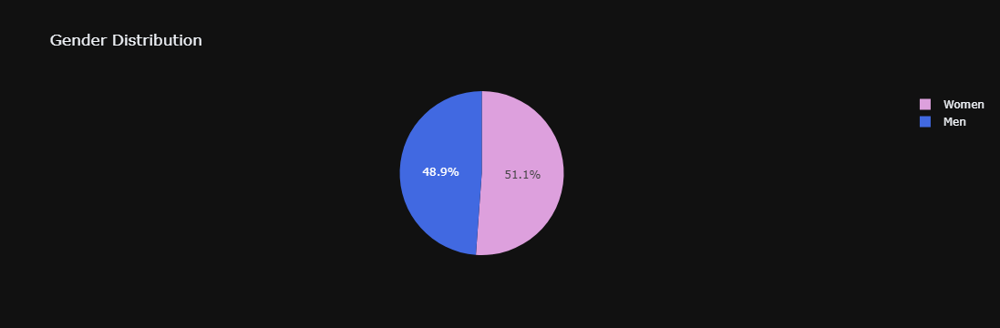

In [6]:
import plotly.graph_objects as go

gender_data = [total_men, total_women]
labels = ['Men', 'Women']

fig = go.Figure(go.Pie( #pie chart
    labels=labels,
    values=gender_data,
    textinfo='percent',
    marker=dict(colors=['royalblue', 'plum']), 
))

fig.update_layout(
    title='Gender Distribution',
    height=600, 
    template='plotly_dark',
    showlegend=True
)

fig.show()


In [7]:
print(october_df[['urban_population', 'rural_population']].head(10)) 

   urban_population  rural_population
0          373503.0          231017.0
1          312455.0               NaN
2           10162.0               NaN
3               NaN           13677.0
4               NaN           18986.0
5           41490.0           22959.0
6               NaN           17389.0
7               NaN           32244.0
8            3250.0           16522.0
9            6146.0           28503.0


In [8]:
print(october_df['urban_population'].isna().sum())
print(october_df['rural_population'].isna().sum())

124
38


In [9]:
urban_population = october_df[october_df['is_region'] == 1]['urban_population'].sum()
rural_population = october_df[october_df['is_region'] == 1]['rural_population'].sum()

print(f"Urban population: {urban_population}")
print(f"Rural population: {rural_population}")

Urban population: 12704977.0
Rural population: 7518241.0


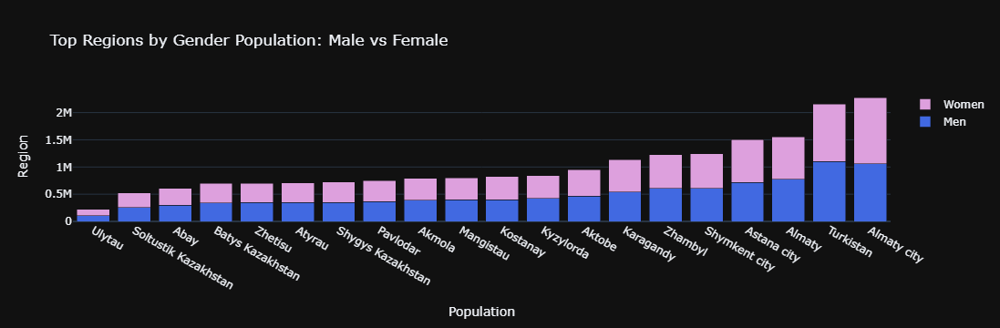

In [10]:
import plotly.graph_objects as go

october_df_regions = october_df[october_df['is_region'] == 1]
df_regions_top = october_df_regions.sort_values(by='total population', ascending=True)

fig = go.Figure()

fig.add_trace(go.Bar( # bars for 'Men'
    x=df_regions_top['region'],
    y=df_regions_top['men'],
    name='Men',
    orientation='v',
    marker=dict(color='royalblue')
))

fig.add_trace(go.Bar( # bars for 'Women'
    x=df_regions_top['region'],
    y=df_regions_top['women'],
    name='Women',
    orientation='v',
    marker=dict(color='plum'),
))

fig.update_layout(
    title='Top Regions by Gender Population: Male vs Female',
    xaxis_title='Population',
    barmode='stack',
    yaxis_title='Region',
    template='plotly_dark',  
    height=600,  
    showlegend=True
)
fig.show()


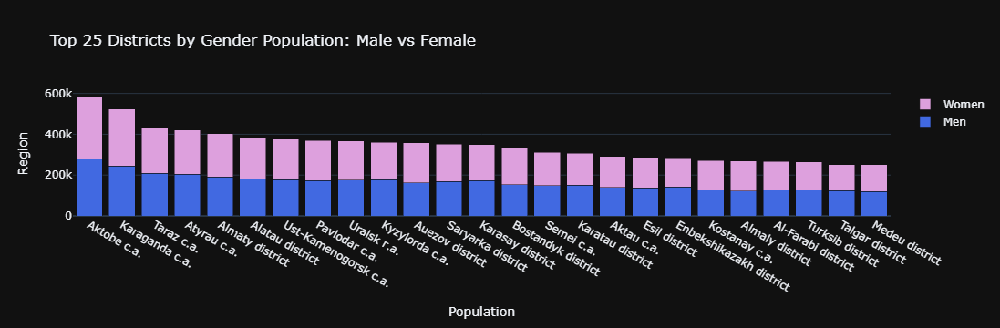

In [11]:
october_df_districts = october_df[october_df['is_district'] == 1]
df_districts_top = october_df_districts.sort_values(by='total population', ascending=False).head(25)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=df_districts_top['region'],
    y=df_districts_top['men'],
    name='Men',
    orientation='v',
    marker=dict(color='royalblue')
))

fig.add_trace(go.Bar(
    x=df_districts_top['region'],
    y=df_districts_top['women'],
    name='Women',
    orientation='v',
    marker=dict(color='plum'),
))

fig.update_layout(
    title='Top 25 Districts by Gender Population: Male vs Female',
    xaxis_title='Population',
    barmode='stack', 
    yaxis_title='Region',
    template='plotly_dark', 
    height=600, 
    showlegend=True
)
fig.show()

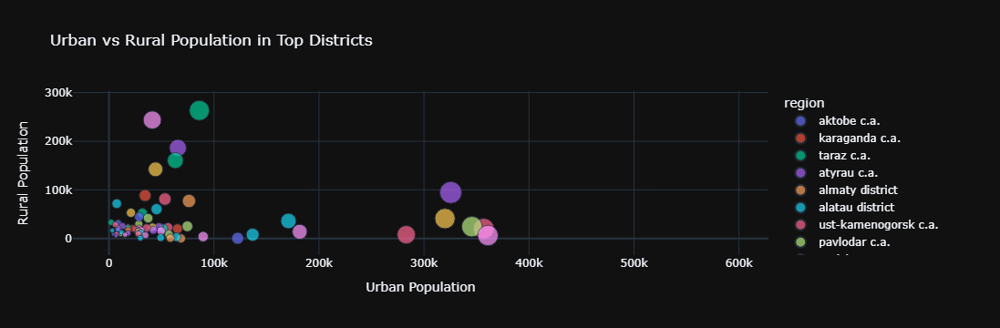

In [224]:
import plotly.express as px

df_bubble = october_df_districts.sort_values(by='total population', ascending=False)
fig = px.scatter(
    df_bubble,
    x="urban_population",  
    y="rural_population",  
    size="total population", 
    color="region", 
    hover_name="region", 
    title="Urban vs Rural Population in Top Districts",
    labels={
        "urban_population": "Urban Population",
        "rural_population": "Rural Population"
    },
    template="plotly_dark"
)

fig.update_layout(
    xaxis_title="Urban Population",
    yaxis_title="Rural Population",
    height=600,
    showlegend=True
)
fig.show()


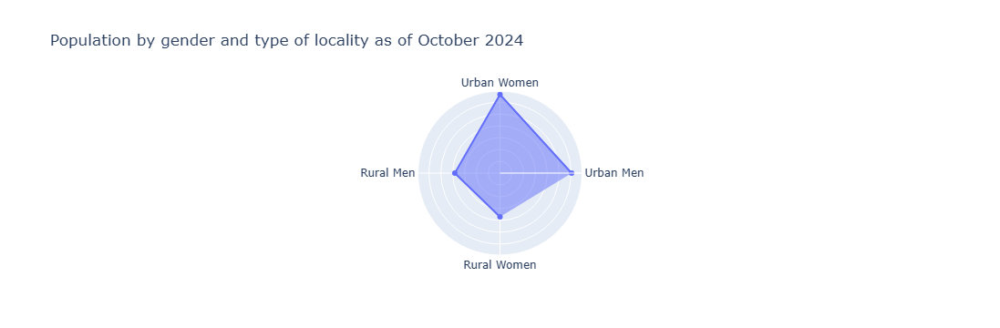

In [225]:
import plotly.graph_objects as go

categories = ['Urban Men', 'Urban Women', 'Rural Men', 'Rural Women']
values = [
    october_df_regions['urban_population_men'].sum(), 
    october_df_regions['urban_population_women'].sum(),
    october_df_regions['rural_population_men'].sum(), 
    october_df_regions['rural_population_women'].sum()
]

fig = go.Figure(data=go.Scatterpolar(
    r=values,
    theta=categories,
    fill='toself',
    name='overall metrics'
))

fig.update_layout(
    polar=dict(
        radialaxis=dict(showticklabels=False, ticks=''),
    ),
    showlegend=False,
    title='Population by gender and type of locality as of October 2024'
)

fig.show()

In [226]:
import folium
import geopandas as gpd
import json

geojson_path = 'kazakhstan_regions.json'
with open(geojson_path, 'r') as file:
    regions_data = json.load(file)

for feature in regions_data['features']:
    feature['properties']['name'] = feature['properties']['name'].strip().lower()

gdf = gpd.GeoDataFrame.from_features(regions_data['features'])

# BasicAnalysis
print(gdf.head())  
print(gdf.info())
print(gdf.geometry.geom_type.unique())  # check the types of geometries ('Polygon', 'MultiPolygon')
print(gdf.columns)  

                                            geometry                  source  \
0  MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...  https://simplemaps.com   
1  POLYGON ((56.69497 45.15835, 56.69485 45.15901...  https://simplemaps.com   
2  POLYGON ((75.8201 42.93544, 75.78668 42.93696,...  https://simplemaps.com   
3  MULTIPOLYGON (((76.96553 43.37987, 76.9656 43....  https://simplemaps.com   
4  MULTIPOLYGON (((53.68008 49.19527, 53.75788 49...  https://simplemaps.com   

     id         name  
0  KZ11       akmola  
1  KZ15       aktobe  
2  KZ19       almaty  
3  KZ75  almaty city  
4  KZ23       atyrau  
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  20 non-null     geometry
 1   source    20 non-null     object  
 2   id        20 non-null     object  
 3   name      20 non-null     object  
dtypes: geometry(1), object(3)


In [227]:
print(gdf.crs)

None


In [228]:
gdf.set_crs('EPSG:4326', allow_override=True, inplace=True)
print(gdf.crs)

EPSG:4326


In [229]:
print(gdf['name'].unique())

['akmola' 'aktobe' 'almaty' 'almaty city' 'atyrau' 'abay' 'zhambyl'
 'ulytau' 'kostanay' 'kyzylorda' 'mangistau' 'soltustik kazakhstan'
 'astana city' 'pavlodar' 'shymkent city' 'turkistan' 'batys kazakhstan'
 'karagandy' 'zhetisu' 'shygys kazakhstan']


In [ ]:
##binding october_df to geopandasdf in order to create folium map

In [230]:
# normalizing regions because they share it as a common value
october_df['region'] = october_df['region'].str.lower().str.strip()
gdf['name'] = gdf['name'].str.lower().str.strip()

october_df_regions = october_df[october_df['is_region'] == 1]
print(october_df_regions.columns)
print(gdf.columns)

Index(['region', 'total population', 'men', 'women', 'urban_population',
       'urban_population_men', 'urban_population_women', 'rural_population',
       'rural_population_men', 'rural_population_women', 'is_region',
       'is_district'],
      dtype='object')
Index(['geometry', 'source', 'id', 'name'], dtype='object')


In [231]:
merged_gdf = gdf.merge(
    october_df_regions,
    left_on='name',
    right_on='region',
    how='left'
)
print(merged_gdf.columns)

Index(['geometry', 'source', 'id', 'name', 'region', 'total population', 'men',
       'women', 'urban_population', 'urban_population_men',
       'urban_population_women', 'rural_population', 'rural_population_men',
       'rural_population_women', 'is_region', 'is_district'],
      dtype='object')


In [194]:
merged_gdf.head(5)

,geometry,source,id,name,region,total population,men,women,urban_population,urban_population_men,urban_population_women,rural_population,rural_population_men,rural_population_women,is_region,is_district
0,"MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...",https://simplemaps.com,KZ11,akmola,akmola,788396.0,387036.0,401360.0,449615.0,214673.0,234942.0,338781.0,172363.0,166418.0,1,0
1,"POLYGON ((56.69497 45.15835, 56.69485 45.15901...",https://simplemaps.com,KZ15,aktobe,aktobe,947651.0,465296.0,482355.0,714163.0,345127.0,369036.0,233488.0,120169.0,113319.0,1,0
2,"POLYGON ((75.8201 42.93544, 75.78668 42.93696,...",https://simplemaps.com,KZ19,almaty,almaty,1551350.0,776724.0,774626.0,302449.0,148942.0,153507.0,1248901.0,627782.0,621119.0,1,0
3,"MULTIPOLYGON (((76.96553 43.37987, 76.9656 43....",https://simplemaps.com,KZ75,almaty city,almaty city,2275541.0,1058593.0,1216948.0,2275541.0,1058593.0,1216948.0,NaN,NaN,NaN,1,0
4,"MULTIPOLYGON (((53.68008 49.19527, 53.75788 49...",https://simplemaps.com,KZ23,atyrau,atyrau,709402.0,350779.0,358623.0,390791.0,189111.0,201680.0,318611.0,161668.0,156943.0,1,0


In [232]:
merged_gdf = merged_gdf.drop(columns=['region', 'source', 'is_district', 'is_region'])

In [233]:
merged_gdf.head(3)

,geometry,id,name,total population,men,women,urban_population,urban_population_men,urban_population_women,rural_population,rural_population_men,rural_population_women
0,"MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...",KZ11,akmola,788396.0,387036.0,401360.0,449615.0,214673.0,234942.0,338781.0,172363.0,166418.0
1,"POLYGON ((56.69497 45.15835, 56.69485 45.15901...",KZ15,aktobe,947651.0,465296.0,482355.0,714163.0,345127.0,369036.0,233488.0,120169.0,113319.0
2,"POLYGON ((75.8201 42.93544, 75.78668 42.93696,...",KZ19,almaty,1551350.0,776724.0,774626.0,302449.0,148942.0,153507.0,1248901.0,627782.0,621119.0


In [198]:
import folium
from folium import Choropleth
from folium.features import GeoJsonTooltip

m = folium.Map(location=[48.0, 68.0], zoom_start=5)

choropleth = Choropleth(
    geo_data=merged_gdf,  
    data=october_df_regions, 
    columns=['region', 'total population'], 
    key_on='feature.properties.name', 
    fill_color='YlGnBu', 
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Population by Region as of October 2024'
).add_to(m)

tooltip = GeoJsonTooltip(
    fields=['name', 'total population', 'men', 'women', 'urban_population', 'rural_population'],
    aliases=['Region:', 'Total Population:', 'Men:', 'Women:', 'Urban Population:', 'Rural Population:'],
    localize=True,
    sticky=False
)

def highlight_function(feature):
    return {
        'fillColor': 'turquoise',
        'weight': 2,
        'fillOpacity': 0.7
}

folium.GeoJson(
    merged_gdf,
    name="regions",
    tooltip=tooltip,
    highlight_function=highlight_function
).add_to(m)

m

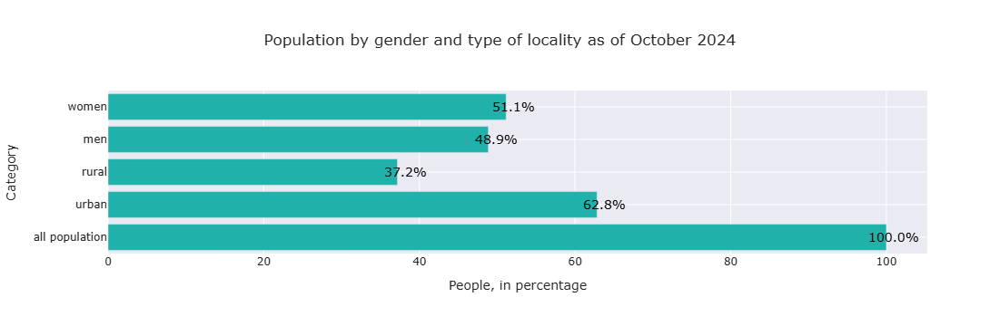

In [234]:
import plotly.graph_objects as go

total_population = october_df['total population'].sum()
urban_population_percentage = (october_df['urban_population'].sum() / total_population) * 100
rural_population_percentage = (october_df['rural_population'].sum() / total_population) * 100
men_percentage = (october_df['men'].sum() / total_population) * 100
women_percentage = (october_df['women'].sum() / total_population) * 100

categories = ['all population', 'urban', 'rural', 'men', 'women']
percentages = [100, urban_population_percentage, rural_population_percentage, men_percentage, women_percentage]


fig = go.Figure()
fig.add_trace(go.Bar(
    y=categories, 
    x=percentages, 
    orientation='h',
    marker=dict(color='lightseagreen'),  
))

for i, val in enumerate(percentages):
    fig.add_annotation(
        x=val + 1, 
        y=i,
        text=f'{val:.1f}%',
        showarrow=False,
        font=dict(size=14, color='black'),
        align='left'
    )

fig.update_layout(
    title='Population by gender and type of locality as of October 2024',
    xaxis_title='People, in percentage',
    yaxis_title='Category',
    template='seaborn',
    height=400,
    showlegend=False
)

fig.show()


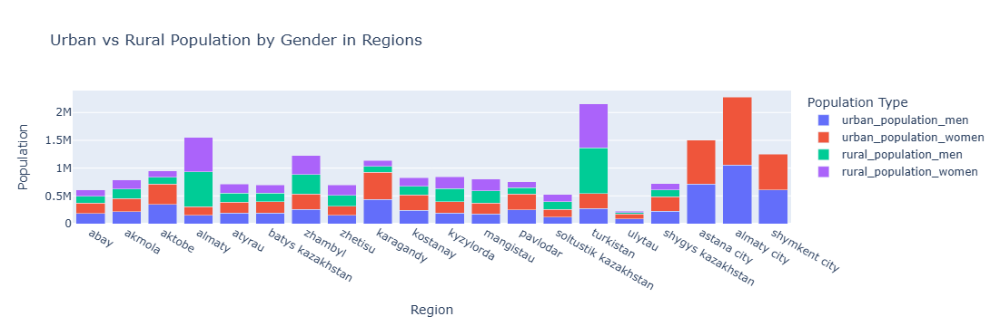

In [235]:
import plotly.express as px

fig = px.bar(october_df_regions, 
             x='region', 
             y=['urban_population_men', 'urban_population_women', 'rural_population_men', 'rural_population_women'],
             title='Urban vs Rural Population by Gender in Regions',
             labels={'region': 'Region', 'value': 'Population', 'variable': 'Population Type'},
             color='variable',
             barmode='stack')

fig.show()


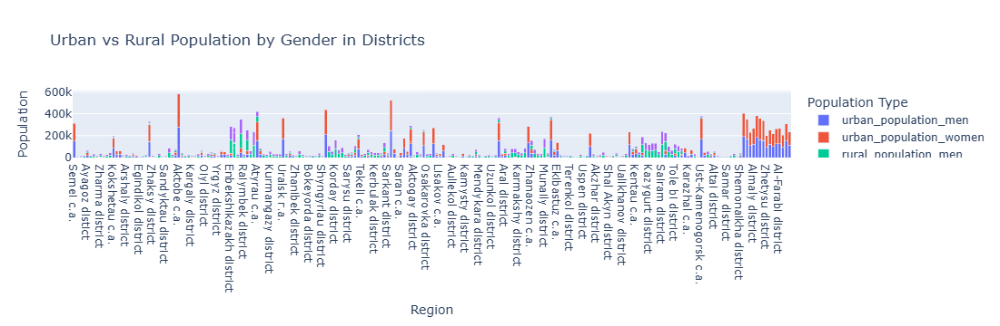

In [202]:
import plotly.express as px

fig = px.bar(october_df_districts, 
             x='region', 
             y=['urban_population_men', 'urban_population_women', 'rural_population_men', 'rural_population_women'],
             title='Urban vs Rural Population by Gender in Districts',
             labels={'region': 'Region', 'value': 'Population', 'variable': 'Population Type'},
             color='variable',
             barmode='stack')
fig.show()

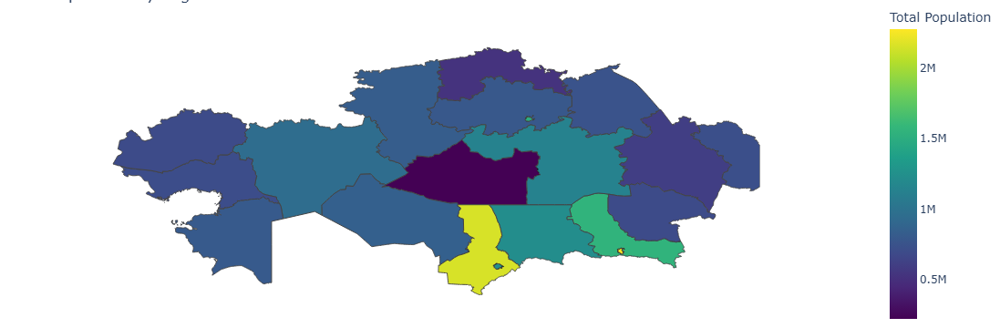

In [236]:
import plotly.express as px

geojson_data = merged_gdf.to_crs(epsg=4326)  # Transform to WGS84 for projection needs
fig = px.choropleth(
    merged_gdf,
    geojson=geojson_data.geometry.__geo_interface__, 
    locations=merged_gdf.index,
    color='total population', 
    hover_name='name',
    hover_data=['total population', 'men', 'women', 'urban_population', 'rural_population'], 
    color_continuous_scale="Viridis", 
    labels={'total population': 'Total Population'}, 
    title="Population by Region in Kazakhstan"
)

fig.update_geos(fitbounds="locations", visible=False)  
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})  
fig.show()


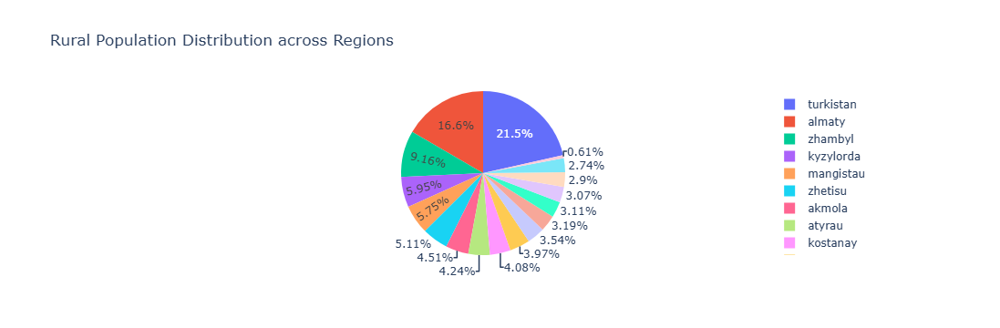

In [238]:
fig = px.pie(october_df_regions, 
             names='region', 
             values='rural_population', 
             title='Rural Population Distribution across Regions')

fig.show()


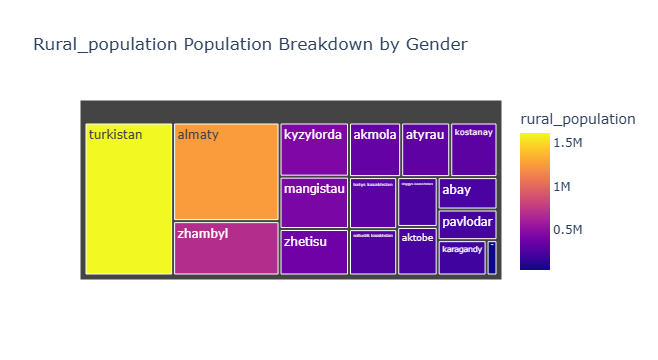

In [205]:
fig = px.treemap(october_df_regions, 
                 path=['region'], 
                 values='rural_population', 
                 color='rural_population', 
                 hover_data=['urban_population_men', 'urban_population_women', 'rural_population_men', 'rural_population_women'],
                 title='Rural_population Population Breakdown by Gender')
fig.show()

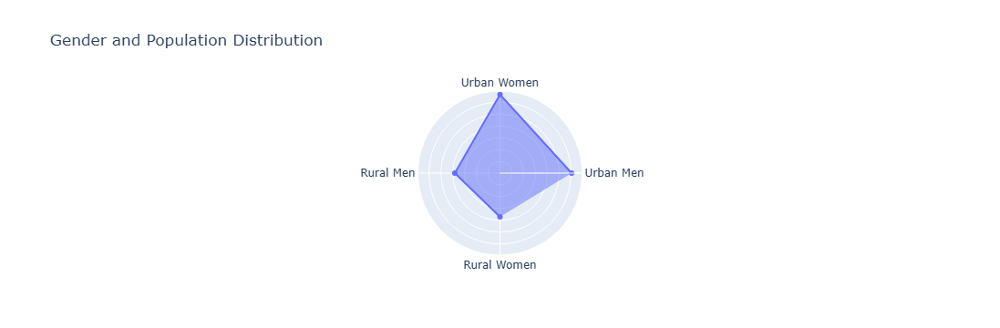

In [210]:
import plotly.graph_objects as go

categories = ['Urban Men', 'Urban Women', 'Rural Men', 'Rural Women']
values = [
    october_df_regions['urban_population_men'].sum(), 
    october_df_regions['urban_population_women'].sum(),
    october_df_regions['rural_population_men'].sum(), 
    october_df_regions['rural_population_women'].sum()
]

fig = go.Figure(data=go.Scatterpolar(
    r=values,
    theta=categories,
    fill='toself',
    name='overall metrics'
))

fig.update_layout(
    polar=dict(
        radialaxis=dict(showticklabels=False, ticks=''),
    ),
    showlegend=False,
    title='Gender and Population Distribution'
)

fig.show()

In [ ]:
##### POPULATION ANALYSIS OF REGIONS 2000-2024

In [1]:
import pandas as pd

file_path = 'population_years.xlsx'
xls = pd.ExcelFile(file_path)

def process_to_columns(sheet_name):
    df = xls.parse(sheet_name)
    columns = ['region'] + [str(col).strip().lower() for col in df.iloc[4, 1:].values]
    cleaned_df = df.iloc[6:, :].copy()
    
    cleaned_df.columns = columns

    cleaned_df.loc[6:27, 'population type'] = 'Total'
    cleaned_df.loc[28:48, 'population type'] = 'Urban'
    cleaned_df.loc[50:, 'population type'] = 'Rural'

    cleaned_df = cleaned_df.dropna(subset=["region"]).reset_index(drop=True)
    cleaned_df = cleaned_df[cleaned_df['region'].str.lower() != 'republic of kazakhstan'].reset_index(drop=True)
    
    # Melt the data into long format
    long_data = cleaned_df.melt(
        id_vars=["region", "population type"], var_name="year", value_name="population"
    )
    # Clean year column
    long_data["year"] = long_data["year"].astype(str).str.replace(".0", "", regex=False)
    
    # Pivot the data to get desired structure
    pivot_data = long_data.pivot_table(
        index="region",
        columns=["year", "population type"],
        values="population",
        aggfunc="first"
    )

    # Flatten hierarchical columns and rename for desired format
    pivot_data.columns = [f"{col[0]}_{col[1].lower()}" for col in pivot_data.columns]
    pivot_data = pivot_data.reset_index()

    new_column_order = ['region']  # Start with 'Region'
    for year in range(2000, 2025):
        new_column_order.extend([
            f"{year}_total", 
            f"{year}_urban", 
            f"{year}_rural"
        ])
    pivot_data = pivot_data[new_column_order]
    return pivot_data

# Process to get the desired structure
all_population_df = process_to_columns("All population")
men_population_df = process_to_columns("Men")
women_population_df = process_to_columns("Women")


In [2]:
all_population_df['region'].unique()

array(['Abay', 'Akmola', 'Aktobe', 'Almaty', 'Almaty city', 'Astana city',
       'Atyrau', 'Batys Kazakhstan', 'Karagandy', 'Kostanay', 'Kyzylorda',
       'Mangistau', 'Pavlodar', 'Shygys Kazakhstan', 'Shymkent city',
       'Soltustik Kazakhstan', 'Turkistan', 'Ulytau', 'Zhambyl',
       'Zhetisu'], dtype=object)

In [3]:
import folium
import geopandas as gpd
import json

geojson_path = 'kazakhstan_regions.json' ## current regions 
with open(geojson_path, 'r') as file:
    regions_data = json.load(file)

for feature in regions_data['features']:
    feature['properties']['name'] = feature['properties']['name'].strip().lower()

gdf_new_regions = gpd.GeoDataFrame.from_features(regions_data['features'])

# BasicAnalysis
print(gdf_new_regions.head())  
print(gdf_new_regions.info())
print(gdf_new_regions.geometry.geom_type.unique())
print(gdf_new_regions.columns)

                                            geometry                  source  \
0  MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...  https://simplemaps.com   
1  POLYGON ((56.69497 45.15835, 56.69485 45.15901...  https://simplemaps.com   
2  POLYGON ((75.8201 42.93544, 75.78668 42.93696,...  https://simplemaps.com   
3  MULTIPOLYGON (((76.96553 43.37987, 76.9656 43....  https://simplemaps.com   
4  MULTIPOLYGON (((53.68008 49.19527, 53.75788 49...  https://simplemaps.com   

     id         name  
0  KZ11       akmola  
1  KZ15       aktobe  
2  KZ19       almaty  
3  KZ75  almaty city  
4  KZ23       atyrau  
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  20 non-null     geometry
 1   source    20 non-null     object  
 2   id        20 non-null     object  
 3   name      20 non-null     object  
dtypes: geometry(1), object(3)


In [4]:
print(gdf_new_regions.crs)
gdf_new_regions.set_crs('EPSG:4326', allow_override=True, inplace=True)
print(gdf_new_regions.crs)

None
EPSG:4326


In [5]:
print(gdf_new_regions['name'].unique())

['akmola' 'aktobe' 'almaty' 'almaty city' 'atyrau' 'abay' 'zhambyl'
 'ulytau' 'kostanay' 'kyzylorda' 'mangistau' 'soltustik kazakhstan'
 'astana city' 'pavlodar' 'shymkent city' 'turkistan' 'batys kazakhstan'
 'karagandy' 'zhetisu' 'shygys kazakhstan']


In [6]:
##normalizing old regions geojson

In [7]:
import folium
import geopandas as gpd
import json

geojson_path = 'ADM_ADM_1.geojson'
with open(geojson_path, 'r', encoding='utf-8') as f:
    regions_data = json.load(f)

def normalize_old_geojson(geojson_data):
    mapping = {
        "almaty": "almaty",
        "pavlodar": "pavlodar",
        "qostanay": "kostanay",
        "qaraghandy": "karagandy",
        "qyzylorda": "kyzylorda",
        "zhambyl": "zhambyl",
        "aqtobe": "aktobe",
        "atyrau": "atyrau",
        "mangghystau": "mangistau",
        "north kazakhstan": "soltustik kazakhstan",
        "aqmola": "akmola",
        # Mapping for derived regions (2000-2021 larger regions split into smaller ones)
        "east kazakhstan": "shygys kazakhstan",
        "west kazakhstan": "batys kazakhstan",
        "south kazakhstan": "turkistan",
        # More mappings can be added based on historical regions
    }
    for feature in geojson_data["features"]:
        # Normalize and map the NAME_1 field
        original_name = feature["properties"].get("NAME_1", "").strip().lower()
        feature["properties"]["name"] = mapping.get(original_name, original_name)

    return geojson_data
    
normalized_regions_data = normalize_old_geojson(regions_data)
gdf_old_regions = gpd.GeoDataFrame.from_features(normalized_regions_data['features'])

# BasicAnalysis
print(gdf_old_regions.head())  
print(gdf_old_regions.info())
print(gdf_old_regions.geometry.geom_type.unique())  # check the types of geometries ('Polygon', 'MultiPolygon')
print(gdf_old_regions.columns)

                                            geometry  fid    GID_1 GID_0  \
0  MULTIPOLYGON (((80.26852 42.28857, 80.28281 42...    1  KAZ.1_1   KAZ   
1  MULTIPOLYGON (((70.91245 50.40975, 70.89961 50...    2  KAZ.2_1   KAZ   
2  MULTIPOLYGON (((54.82615 48.3611, 54.78796 48....    3  KAZ.3_1   KAZ   
3  MULTIPOLYGON (((49.56539 46.13751, 49.56726 46...    4  KAZ.4_1   KAZ   
4  MULTIPOLYGON (((83.02541 47.19888, 83.0229 47....    5  KAZ.5_1   KAZ   

      COUNTRY           NAME_1                         VARNAME_1 NL_NAME_1  \
0  Kazakhstan           Almaty  Alma-Ata|Alma-Atinskaya Oblast'|        NA   
1  Kazakhstan           Aqmola     Akmolin|Akmolinsk|Tselinograd        NA   
2  Kazakhstan           Aqtobe                        Aktyubinsk        NA   
3  Kazakhstan           Atyrau                  Ateransk|Gur'yev        NA   
4  Kazakhstan  East Kazakhstan  Shyghys Qazaqstan|Vostochno-Kaza        NA   

   TYPE_1 ENGTYPE_1 CC_1 HASC_1   ISO_1               name  
0  Oblasy    

In [8]:
gdf_old_regions['name'].unique

<bound method Series.unique of 0                   almaty
1                   akmola
2                   aktobe
3                   atyrau
4        shygys kazakhstan
5                mangistau
6     soltustik kazakhstan
7                 pavlodar
8                karagandy
9                 kostanay
10               kyzylorda
11               turkistan
12        batys kazakhstan
13                 zhambyl
Name: name, dtype: object>

In [9]:
print(gdf_old_regions.crs)
gdf_old_regions.set_crs('EPSG:4326', allow_override=True, inplace=True)
print(gdf_old_regions.crs)

None
EPSG:4326


In [10]:
##normalizing gdf_old and gdf_new before binding to populaiton data

In [11]:
all_population_df['region'] = all_population_df['region'].str.lower().str.strip()
men_population_df['region'] = men_population_df['region'].str.lower().str.strip()
women_population_df['region'] = women_population_df['region'].str.lower().str.strip()
gdf_old_regions['name'] = gdf_old_regions['name'].str.lower().str.strip()
gdf_new_regions['name'] = gdf_new_regions['name'].str.lower().str.strip()
print(men_population_df['region'].unique())
print(gdf_old_regions['name'].unique())
print(gdf_new_regions['name'].unique())

['abay' 'akmola' 'aktobe' 'almaty' 'almaty city' 'astana city' 'atyrau'
 'batys kazakhstan' 'karagandy' 'kostanay' 'kyzylorda' 'mangistau'
 'pavlodar' 'shygys kazakhstan' 'shymkent city' 'soltustik kazakhstan'
 'turkistan' 'ulytau' 'zhambyl' 'zhetisu']
['almaty' 'akmola' 'aktobe' 'atyrau' 'shygys kazakhstan' 'mangistau'
 'soltustik kazakhstan' 'pavlodar' 'karagandy' 'kostanay' 'kyzylorda'
 'turkistan' 'batys kazakhstan' 'zhambyl']
['akmola' 'aktobe' 'almaty' 'almaty city' 'atyrau' 'abay' 'zhambyl'
 'ulytau' 'kostanay' 'kyzylorda' 'mangistau' 'soltustik kazakhstan'
 'astana city' 'pavlodar' 'shymkent city' 'turkistan' 'batys kazakhstan'
 'karagandy' 'zhetisu' 'shygys kazakhstan']


In [13]:
##binding gdf_old_regions and  gdf_new_regions to population data

In [14]:
def merge_gdf_to_population(gdf, population_df):
    merged_gdf = gdf.merge(
        population_df,
        left_on='name',
        right_on='region',
        how='left'
    )
    return merged_gdf

merged_gdf_old_regions_all_populations = merge_gdf_to_population(gdf_old_regions, all_population_df)
merged_gdf_old_regions_men_populations = merge_gdf_to_population(gdf_old_regions, men_population_df)
merged_gdf_old_regions_women_populations = merge_gdf_to_population(gdf_old_regions, women_population_df)

merged_gdf_new_regions_all_populations = merge_gdf_to_population(gdf_new_regions, all_population_df)
merged_gdf_new_regions_men_populations = merge_gdf_to_population(gdf_new_regions, men_population_df)
merged_gdf_new_regions_women_populations = merge_gdf_to_population(gdf_new_regions, women_population_df)

print(merged_gdf_old_regions_all_populations["region"].unique())
print(merged_gdf_new_regions_all_populations["region"].unique())


['almaty' 'akmola' 'aktobe' 'atyrau' 'shygys kazakhstan' 'mangistau'
 'soltustik kazakhstan' 'pavlodar' 'karagandy' 'kostanay' 'kyzylorda'
 'turkistan' 'batys kazakhstan' 'zhambyl']
['akmola' 'aktobe' 'almaty' 'almaty city' 'atyrau' 'abay' 'zhambyl'
 'ulytau' 'kostanay' 'kyzylorda' 'mangistau' 'soltustik kazakhstan'
 'astana city' 'pavlodar' 'shymkent city' 'turkistan' 'batys kazakhstan'
 'karagandy' 'zhetisu' 'shygys kazakhstan']


In [15]:
merged_gdf_new_regions_all_populations.head(2)
merged_gdf_old_regions_all_populations.head(2)

,geometry,fid,GID_1,GID_0,COUNTRY,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,...,2021_rural,2022_total,2022_urban,2022_rural,2023_total,2023_urban,2023_rural,2024_total,2024_urban,2024_rural
0,"MULTIPOLYGON (((80.26852 42.28857, 80.28281 42...",1,KAZ.1_1,KAZ,Kazakhstan,Almaty,Alma-Ata|Alma-Atinskaya Oblast'|,NA,Oblasy,Region,...,1622882,1478496.0,241061.0,1237435.0,1505896.0,243889.0,1262007.0,1531167.0,247519.0,1283648.0
1,"MULTIPOLYGON (((70.91245 50.40975, 70.89961 50...",2,KAZ.2_1,KAZ,Kazakhstan,Aqmola,Akmolin|Akmolinsk|Tselinograd,NA,Oblasy,Region,...,386246,785708.0,438207.0,347501.0,788013.0,441997.0,346016.0,787976.0,445712.0,342264.0


In [54]:
import folium
from folium import Choropleth
from folium.features import GeoJsonTooltip

def create_folium_map_with_year_filter(
    gdf_old_regions_all_populations,
    gdf_old_regions_men_populations,
    gdf_old_regions_women_populations,
    gdf_new_regions_all_populations,
    gdf_new_regions_men_populations,
    gdf_new_regions_women_populations,
    year, 
    map_location=(48.0196, 66.9237), 
    zoom_start=5
):
    year_int = int(year)
    
    if year_int < 2022:
        gdf_all_populations = gdf_old_regions_all_populations
        gdf_men_populations = gdf_old_regions_men_populations
        gdf_women_populations = gdf_old_regions_women_populations
    else:
        gdf_all_populations = gdf_new_regions_all_populations
        gdf_men_populations = gdf_new_regions_men_populations
        gdf_women_populations = gdf_new_regions_women_populations

    merged_gdf = gdf_all_populations.copy()
    for field in ["men_total", "men_urban", "men_rural", "women_total", "women_urban", "women_rural"]:
        # Assign columns dynamically or fill with None if not present
        data_source = gdf_men_populations if "men" in field else gdf_women_populations
        population_field = f"{year}_{field.split('_')[-1]}"  # e.g., "2020_total"
        merged_gdf[field] = data_source.get(population_field, None) if population_field in data_source.columns else None

    if "id" not in merged_gdf.columns:
        merged_gdf["id"] = merged_gdf.index  # Add `id` column using the index if it doesn't exist

    population_map = folium.Map(location=map_location, zoom_start=zoom_start)

    Choropleth(
        geo_data=merged_gdf,
        data=merged_gdf,
        columns=["id", f"{year}_total"],  # Use the region ID and total population
        key_on="feature.properties.id",  # Bind data to GeoJSON `id`
        fill_color="YlGnBu",  
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f"Total Population by Region({year})"
    ).add_to(population_map)

    # Add tooltips for additional details
    tooltip = GeoJsonTooltip(
        fields=[
            "name",
            f"{year}_total",
            f"{year}_urban",
            f"{year}_rural",
            "men_total",
            "men_urban",
            "men_rural",
            "women_total",
            "women_urban",
            "women_rural",
        ],
        aliases=[
            "Region:",
            "Total Population (All):",
            "Urban Population (All):",
            "Rural Population (All):",
            "Total Population (Men):",
            "Urban Population (Men):",
            "Rural Population (Men):",
            "Total Population (Women):",
            "Urban Population (Women):",
            "Rural Population (Women):",
        ],
        localize=True
    )

    # Add GeoJson with highlight and tooltip
    geojson_layer = folium.GeoJson(
        merged_gdf,
        style_function=lambda feature: {
            "fillColor": "lightblue",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.3,
        },
        highlight_function=lambda feature: {
            "fillColor": "aquamarine",
            "color": "blue",
            "weight": 3,
            "fillOpacity": 0.5,
        },
        tooltip=tooltip
    )
    geojson_layer.add_to(population_map)

    return population_map

# Example Usage:
map_2006 = create_folium_map_with_year_filter(
    merged_gdf_old_regions_all_populations,
    merged_gdf_old_regions_men_populations,
    merged_gdf_old_regions_women_populations,
    merged_gdf_new_regions_all_populations,
    merged_gdf_new_regions_men_populations,
    merged_gdf_new_regions_women_populations,
    year="2006"
)

map_2006


In [49]:
import pandas as pd

def prepare_population_data(gdf):
    """
    Prepares population data from a GeoDataFrame for visualization.
    Extracts columns ending with '_total', '_urban', and '_rural' and reshapes them.
    
    Parameters:
        gdf (GeoDataFrame): The population GeoDataFrame (old or new).
    
    Returns:
        DataFrame: A reshaped DataFrame with columns 'region', 'year', 'total_population', 'urban_population', 'rural_population'.
    """
    # Identify population columns based on naming conventions
    total_population_cols = [col for col in gdf.columns if col.endswith("_total")]
    urban_population_cols = [col for col in gdf.columns if col.endswith("_urban")]
    rural_population_cols = [col for col in gdf.columns if col.endswith("_rural")]
    
    # Prepare the reshaped DataFrame for each population type
    df = pd.DataFrame(
        {
            "region": gdf["region"].repeat(len(total_population_cols)),
            "year": [col.split("_")[0] for col in total_population_cols] * len(gdf),
            "total_population": gdf[total_population_cols].values.flatten(),
            "urban_population": gdf[urban_population_cols].values.flatten(),
            "rural_population": gdf[rural_population_cols].values.flatten(),
        }
    )

    # If any of the columns have NaN values, fill with 0 to ensure proper population calculations
    df["total_population"] = pd.to_numeric(df["total_population"], errors="coerce").fillna(0)
    df["urban_population"] = pd.to_numeric(df["urban_population"], errors="coerce").fillna(0)
    df["rural_population"] = pd.to_numeric(df["rural_population"], errors="coerce").fillna(0)

    return df

df_old_population = prepare_population_data(merged_gdf_old_regions_all_populations)
df_new_population = prepare_population_data(merged_gdf_new_regions_all_populations)
population_df = pd.concat([df_old_population, df_new_population])

print(population_df.head())
   

   region  year  total_population  urban_population  rural_population
0  almaty  2000         1557141.0          462726.0         1094415.0
0  almaty  2001         1554320.0          458344.0         1095976.0
0  almaty  2002         1554573.0          456441.0         1098132.0
0  almaty  2003         1560267.0          459141.0         1101126.0
0  almaty  2004         1571194.0          464726.0         1106468.0


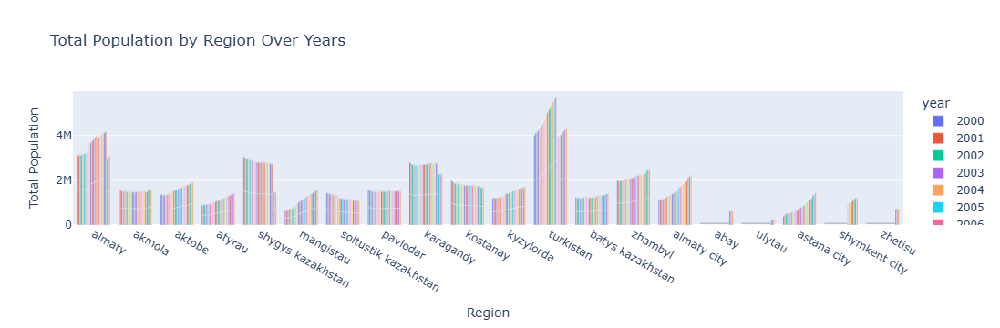

In [50]:
fig = px.bar(
    population_df,
    x="region",
    y="total_population",
    color="year",
    barmode="group",
    title="Total Population by Region Over Years",
    labels={"region": "Region", "total_population": "Total Population"},
    text="total_population",  # Show exact values
    height=600,
)

fig.update_traces(texttemplate='%{text}', textposition="outside")
fig.show()


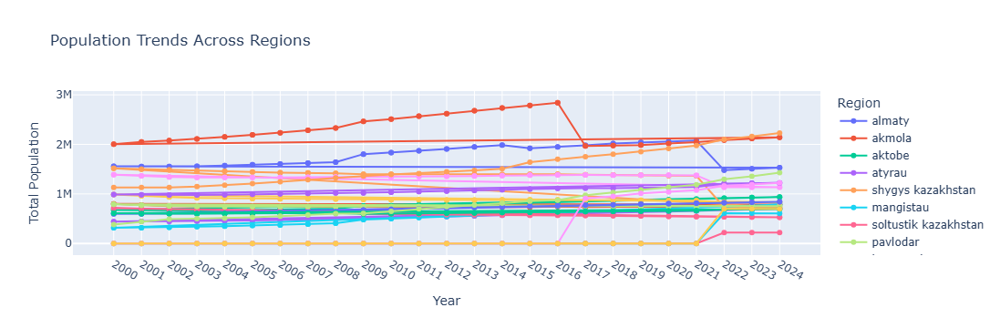

In [51]:
fig = px.line(
    population_df,
    x="year",
    y="total_population",
    color="region",
    markers=True,
    title="Population Trends Across Regions",
    labels={"year": "Year", "total_population": "Total Population", "region": "Region"},
    height=600,
)

fig.update_layout(xaxis=dict(tickmode="linear", dtick=1))  # Show every year
fig.show()
